<a href="https://colab.research.google.com/github/swilli21/GenAI/blob/master/Autoencoder_CIFAR10_Multichannel_images.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Reconstructing Multichannel Images using DNN - Dense Neural Network

In [1]:
import torch.nn as nn
import torchvision
import numpy as np
import torch

import torchvision.transforms as transforms
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F

from tqdm import tqdm #use to display progress bars
from torchvision import datasets
from torchvision.utils import make_grid
from torch.utils.data import DataLoader, random_split

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cpu'

Each image is of the shape 32 x 32 pixels.
The images are divided into 10 categories and each category has 6000 images in the training data



In [3]:
transform = transforms.Compose([transforms.ToTensor()])

train_data = datasets.CIFAR10(
    root='/content/data',
    train=True,
    download=True,
    transform=transform
)

test_data = datasets.CIFAR10(
    root='/content/data',
    train=False,
    download=True,
    transform=transform
)

classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')


In [4]:
len(train_data), len(test_data)

(50000, 10000)

## Split data into training and validation sets

In [5]:
train_data, valid_data = random_split(train_data, [40000,10000])

# DataLoader allows the us to access out data in batches during training

In [6]:
train_dl = DataLoader(train_data, batch_size = 128, shuffle = True)
valid_dl = DataLoader(valid_data, batch_size = 128, shuffle = False)
test_dl = DataLoader(test_data, batch_size = 128, shuffle = False)

In [7]:
len(train_dl.dataset)

40000

In [8]:
len(valid_dl.dataset)

10000

In [9]:
len(test_dl.dataset)

10000

Access the the images from one batch of the training data.

- set up an iterator over the train data loader

- 128 images in each batch
- 3 number of channels (color images [r b g])
- height 32 pixels
- width 32 pixels

In [10]:
train_images, _ = next(iter(train_dl))
train_images = train_images.to(device)
train_images.shape

torch.Size([128, 3, 32, 32])

### Visualize the images

- make_grid make a grid of all images in this training batch.
- np.transpose to flip around the dimensions to be in matplotlib format.
[height, width, num channels]

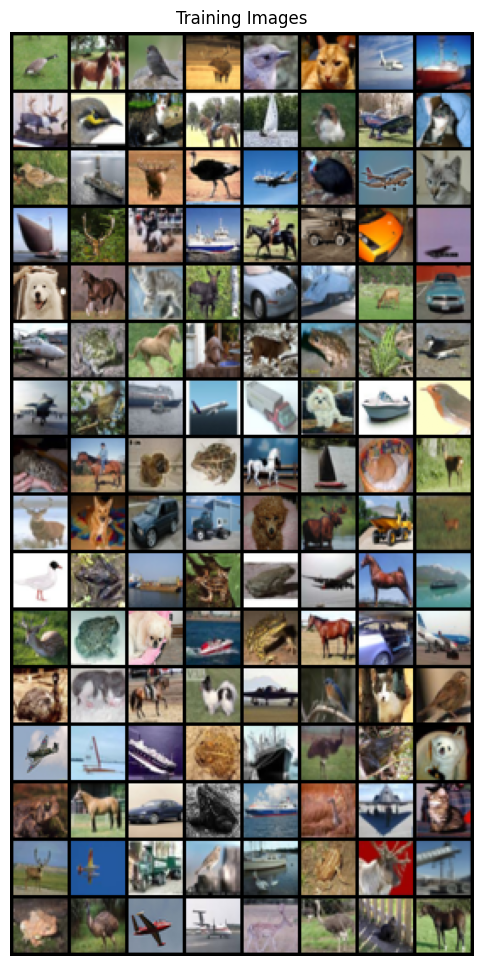

In [11]:
plt.figure(figsize = (20,12))
plt.axis('off')
plt.title('Training Images')
plt.imshow(np.transpose(make_grid(train_images.to(device), padding = 2, normalize = True).cpu(), (1,2,0)))
plt.show()

## Dense Neural Network Autoencoder

- in_features : flattened input
- out_features : twice the size of hidden dimensions in the number of neurons
- The output of the first linear layer is fed into the second linear layer.
- The output of the sencond layer is fed into the third layer


- The forward pass through the encoder first reshapes the input images, so that they are batch size and number of pixels in each image.



In [ ]:
class Encoder(nn.Module):
  def __init__(self, input_dim, hidden_dim, latent_dim):
    super(Encoder, self).__init__()

    self.linear1 = nn.Linear(in_features = input_dim, out_features = 2 * hidden_dim)

    self.linear2 = nn.Linear(in_features = 2 * hidden_dim, out_features = hidden_dim)

    self.linear3 = nn.Linear(in_features = hidden_dim, out_features = latent_dim)

  def forward(self, x):
    x = x.view(-1, input_dim) #performs the flattening
    x = F.relu(self.linear1(x)) # reshaped input passed through the first layer
    x = F.relu(self.linear2(x))
    return self.linear3(x)

The Decoder input is the output of the encoder which is latent_dim

The decoder should be symmetric that is have the same number of layers as the encoder in this case 3.

The out_feature, the final out should be the same as the input dimensions fed into the DNN.

In the forward pass, the input z represent the encodings from the encoder.

In [ ]:
class Decoder(nn.Module):
  def __init__(self, input_dim, hidden_dim, latent_dim):
    super(Decoder, self).__init__()

    self.linear1 = nn.Linear(in_features = latent_dim, out_features = hidden_dim)

    self.linear2 = nn.Linear(in_features = hidden_dim, out_features = 2 * hidden_dim)

    self.linear3 = nn.Linear(in_features = 2 * hidden_dim, out_features = input_dim)

  def forward(self, z):
    z = F.relu(self.linear1(z))
    z = F.relu(self.linear2(z))
    z = torch.sigmoid(self.linear3(z))
    return z.reshape((-1, 3, 32, 32))

In [ ]:
class LinearAutoEncoder(nn.Module):
  def __init__(self, input_dim, hidden_dim, latent_dim):
    super(LinearAutoEncoder, self).__init__()

    self.encoder = Encoder(input_dim, hidden_dim, latent_dim)

    self.decoder = Decoder(input_dim, hidden_dim, latent_dim)

  def forward(self, x):
    z = self.encoder(x)

    return self.decoder(z)

In [ ]:
input_dim = 3 * 32 * 32 #CIFAR image dimensions
hidden_dim = 512
latent_dim = 64 #larger latent representation the DNN will be able to better reconstruct inputs

# instantiate model
model = LinearAutoEncoder(input_dim, hidden_dim, latent_dim)
model.to(device)
print(model)

LinearAutoEncoder(
  (encoder): Encoder(
    (linear1): Linear(in_features=3072, out_features=1024, bias=True)
    (linear2): Linear(in_features=1024, out_features=512, bias=True)
    (linear3): Linear(in_features=512, out_features=64, bias=True)
  )
  (decoder): Decoder(
    (linear1): Linear(in_features=64, out_features=512, bias=True)
    (linear2): Linear(in_features=512, out_features=1024, bias=True)
    (linear3): Linear(in_features=1024, out_features=3072, bias=True)
  )
)


In [ ]:
learning_rate = 1e-3
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr = learning_rate)

In [12]:
def display_images(input, output, n_images = 10):
  n = 10
  plt.figure(figsize =(20,4))

  for i in range(n):

    #display original images
    ax = plt.subplot(2, n, i+1)
    item = input[i].permute(1,2,0)
    plt.imshow(item.cpu().detach().numpy(), cmap='gray') # to show original images
    plt.title(f'Original')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    #display the reconstruction of images
    ax = plt.subplot(2, n, i+1+n)
    ops = output[i].permute(1,2,0)
    plt.imshow(ops.cpu().detach().numpy(), cmap='gray')
    plt.title(f'Reconstructed')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

  plt.show()

  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 0 | Validation Loss: 0.06401


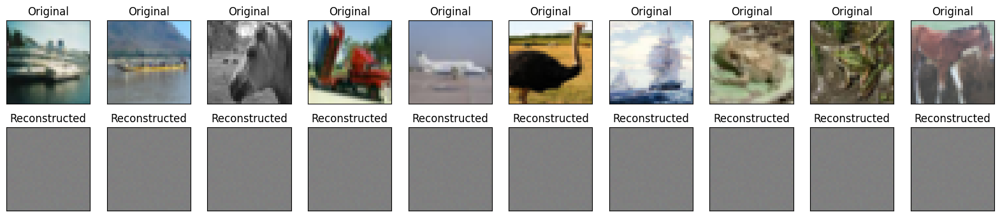

  2%|▏         | 1/41 [00:06<04:00,  6.01s/it]

Epoch 1 | Training Loss: 0.034
Epoch 1 | Validation Loss: 0.02638


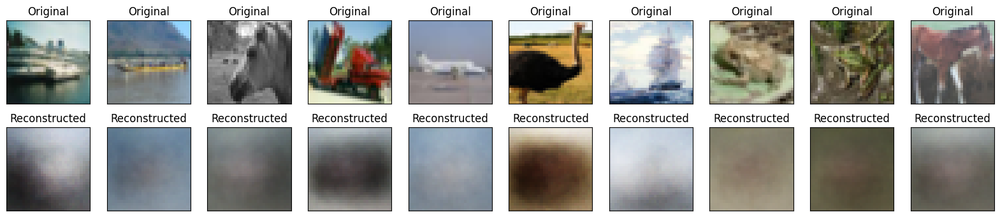

  5%|▍         | 2/41 [01:09<25:43, 39.56s/it]

Epoch 2 | Training Loss: 0.024
Epoch 2 | Validation Loss: 0.02207


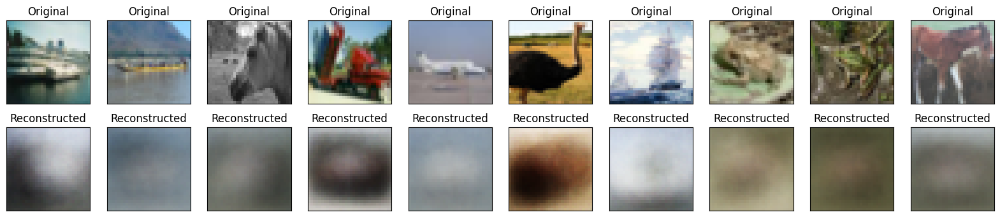

  7%|▋         | 3/41 [02:11<31:43, 50.10s/it]

Epoch 3 | Training Loss: 0.022
Epoch 3 | Validation Loss: 0.02018


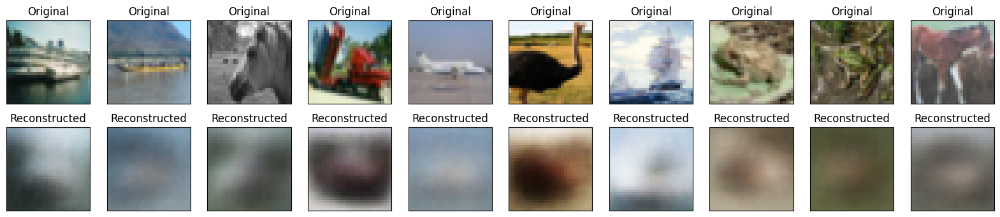

 10%|▉         | 4/41 [03:44<41:11, 66.81s/it]

Epoch 4 | Training Loss: 0.019
Epoch 4 | Validation Loss: 0.01808


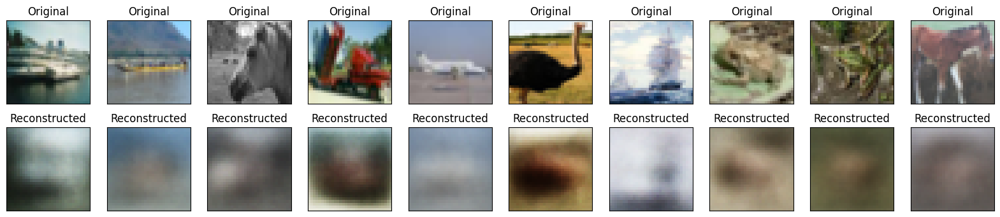

 12%|█▏        | 5/41 [05:12<44:46, 74.61s/it]

Epoch 5 | Training Loss: 0.017
Epoch 5 | Validation Loss: 0.01682


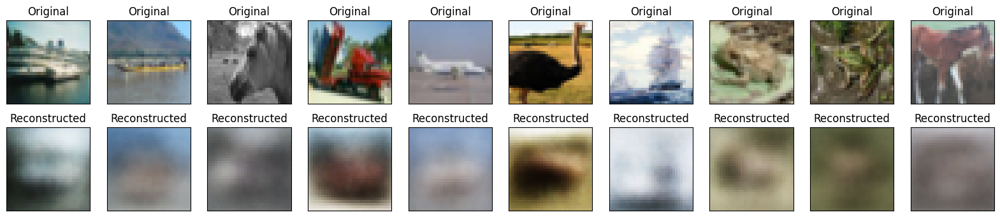

 15%|█▍        | 6/41 [06:39<45:52, 78.63s/it]

Epoch 6 | Training Loss: 0.016
Epoch 6 | Validation Loss: 0.01600


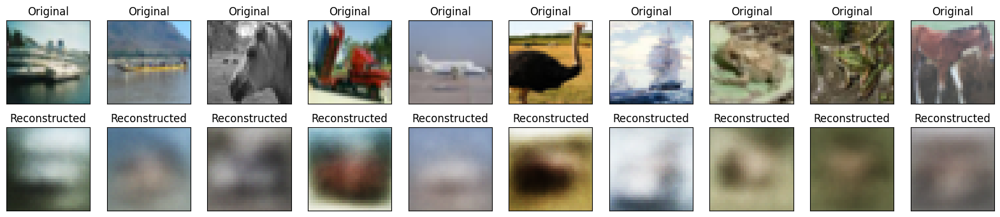

 17%|█▋        | 7/41 [08:07<46:18, 81.71s/it]

Epoch 7 | Training Loss: 0.016
Epoch 7 | Validation Loss: 0.01511


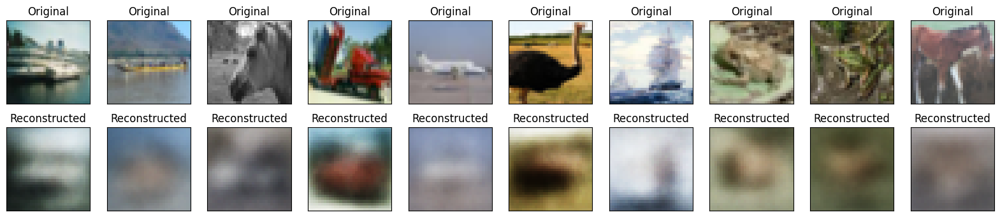

 20%|█▉        | 8/41 [09:35<46:04, 83.77s/it]

Epoch 8 | Training Loss: 0.015
Epoch 8 | Validation Loss: 0.01511


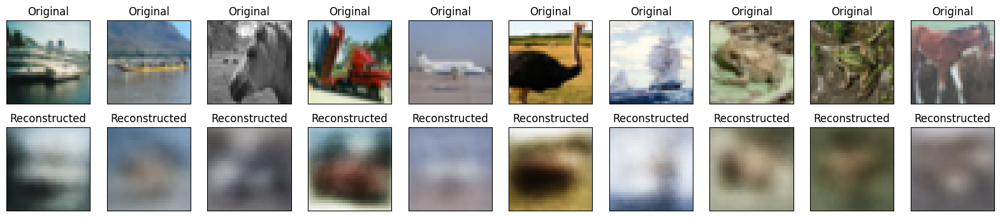

 22%|██▏       | 9/41 [11:06<46:00, 86.25s/it]

Epoch 9 | Training Loss: 0.015
Epoch 9 | Validation Loss: 0.01419


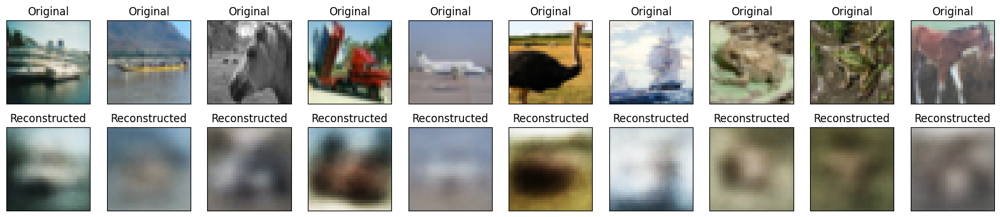

 24%|██▍       | 10/41 [12:45<46:32, 90.09s/it]

Epoch 10 | Training Loss: 0.014
Epoch 10 | Validation Loss: 0.01360


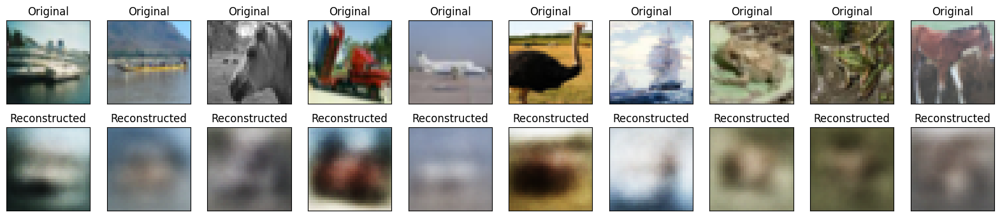

 27%|██▋       | 11/41 [14:15<45:00, 90.01s/it]

Epoch 11 | Training Loss: 0.013
Epoch 11 | Validation Loss: 0.01336


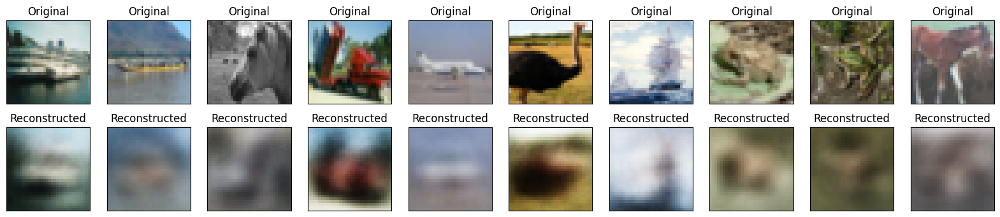

 29%|██▉       | 12/41 [15:43<43:10, 89.34s/it]

Epoch 12 | Training Loss: 0.013
Epoch 12 | Validation Loss: 0.01288


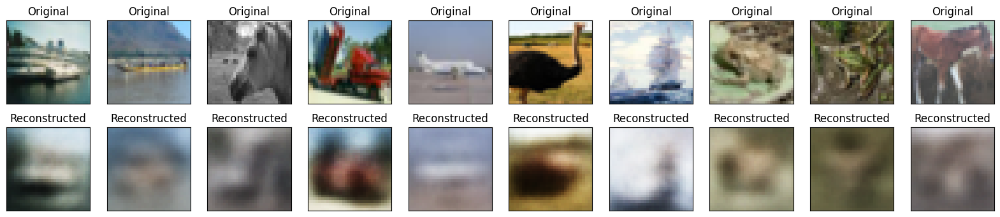

 32%|███▏      | 13/41 [17:10<41:24, 88.75s/it]

Epoch 13 | Training Loss: 0.013
Epoch 13 | Validation Loss: 0.01299


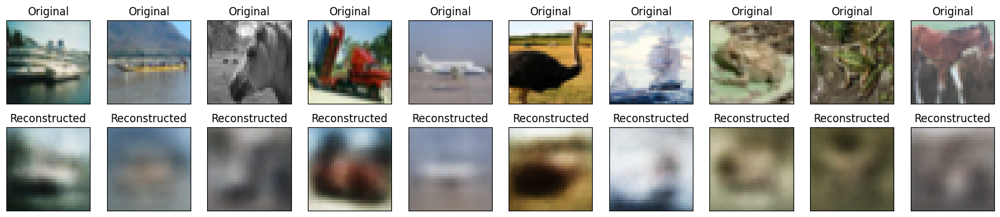

 34%|███▍      | 14/41 [18:37<39:38, 88.08s/it]

Epoch 14 | Training Loss: 0.012
Epoch 14 | Validation Loss: 0.01239


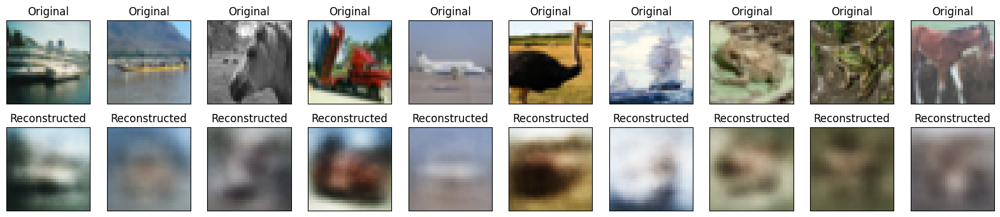

 37%|███▋      | 15/41 [20:04<38:07, 87.96s/it]

Epoch 15 | Training Loss: 0.012
Epoch 15 | Validation Loss: 0.01239


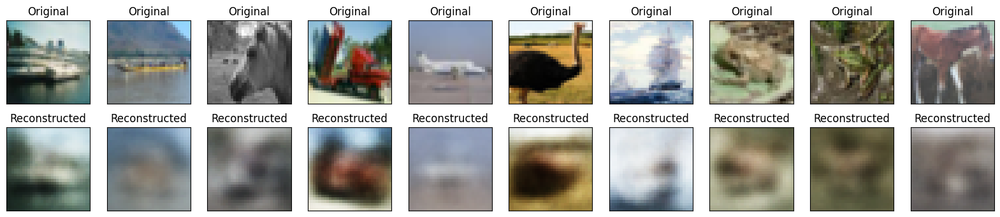

 39%|███▉      | 16/41 [21:32<36:37, 87.89s/it]

Epoch 16 | Training Loss: 0.012
Epoch 16 | Validation Loss: 0.01211


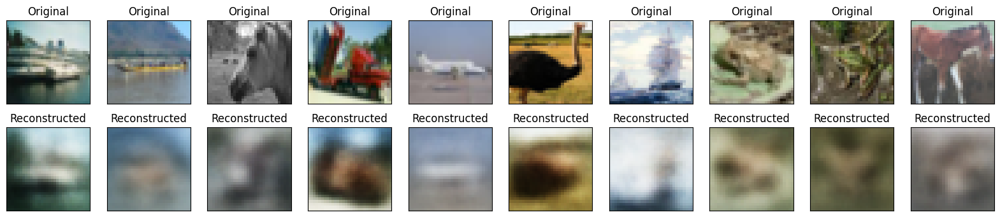

 41%|████▏     | 17/41 [23:00<35:10, 87.94s/it]

Epoch 17 | Training Loss: 0.012
Epoch 17 | Validation Loss: 0.01180


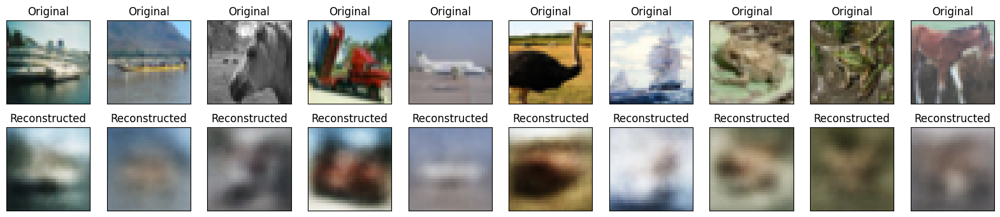

 44%|████▍     | 18/41 [24:28<33:39, 87.81s/it]

Epoch 18 | Training Loss: 0.012
Epoch 18 | Validation Loss: 0.01169


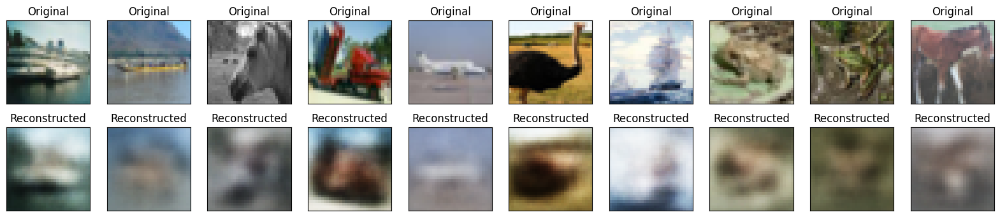

 46%|████▋     | 19/41 [25:55<32:08, 87.67s/it]

Epoch 19 | Training Loss: 0.011
Epoch 19 | Validation Loss: 0.01164


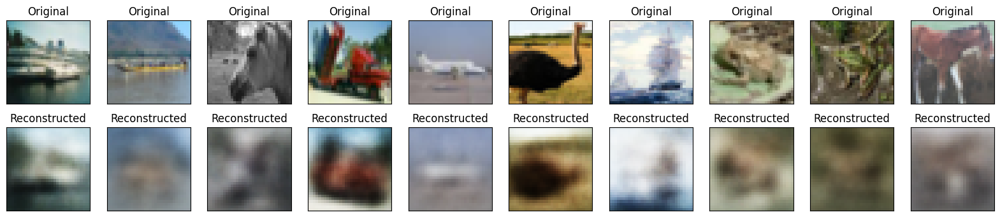

 49%|████▉     | 20/41 [27:23<30:40, 87.64s/it]

Epoch 20 | Training Loss: 0.011
Epoch 20 | Validation Loss: 0.01148


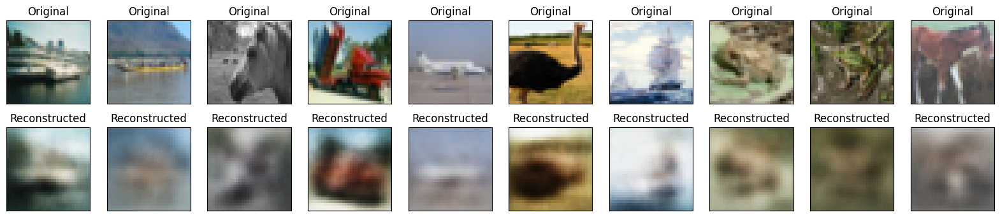

 51%|█████     | 21/41 [28:49<29:05, 87.28s/it]

Epoch 21 | Training Loss: 0.011
Epoch 21 | Validation Loss: 0.01121


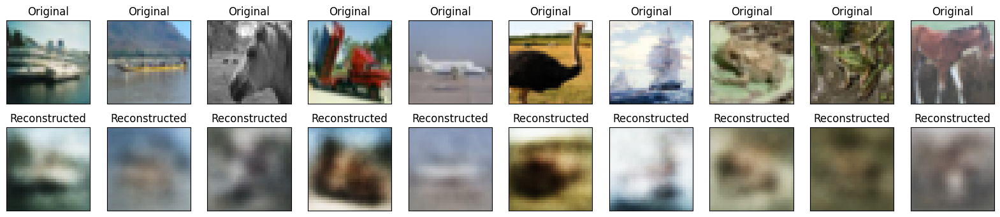

 54%|█████▎    | 22/41 [30:17<27:40, 87.40s/it]

Epoch 22 | Training Loss: 0.011
Epoch 22 | Validation Loss: 0.01115


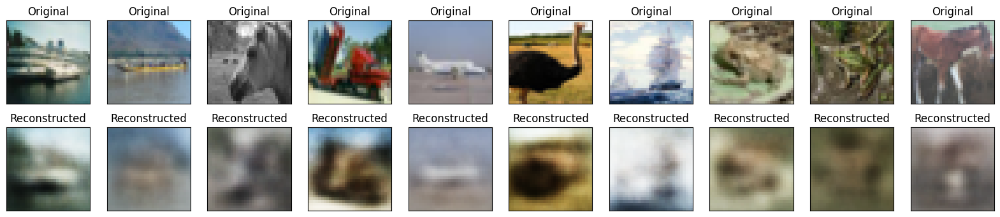

 56%|█████▌    | 23/41 [31:47<26:31, 88.40s/it]

Epoch 23 | Training Loss: 0.011
Epoch 23 | Validation Loss: 0.01085


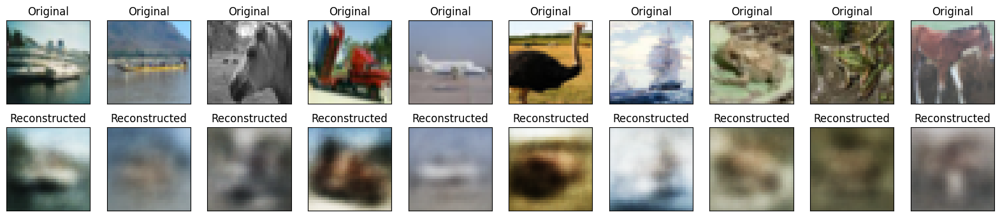

 59%|█████▊    | 24/41 [33:17<25:08, 88.72s/it]

Epoch 24 | Training Loss: 0.011
Epoch 24 | Validation Loss: 0.01077


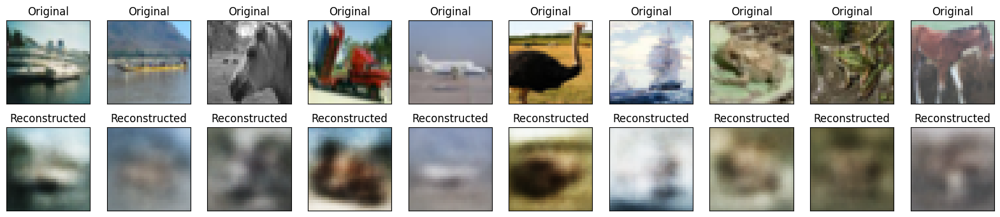

 61%|██████    | 25/41 [34:47<23:46, 89.13s/it]

Epoch 25 | Training Loss: 0.010
Epoch 25 | Validation Loss: 0.01099


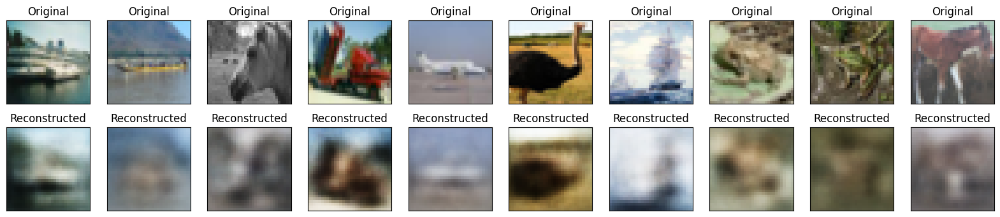

 63%|██████▎   | 26/41 [36:16<22:16, 89.12s/it]

Epoch 26 | Training Loss: 0.010
Epoch 26 | Validation Loss: 0.01047


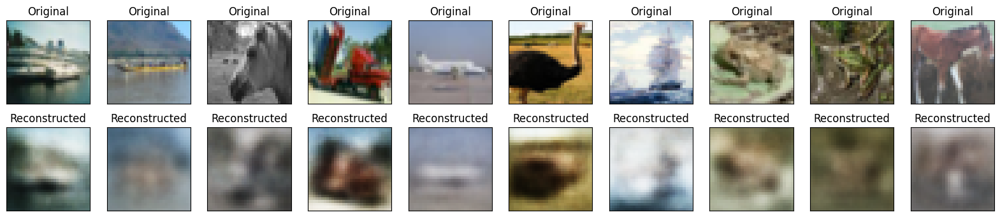

 66%|██████▌   | 27/41 [37:46<20:51, 89.40s/it]

Epoch 27 | Training Loss: 0.010
Epoch 27 | Validation Loss: 0.01040


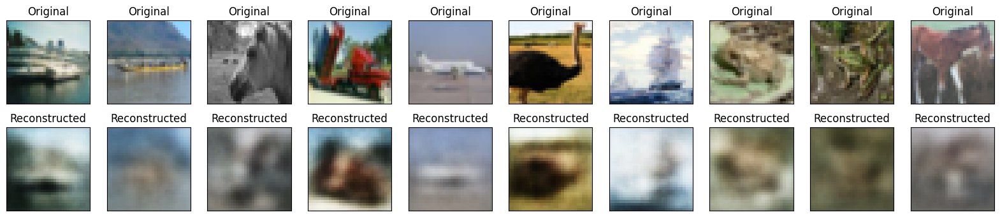

 68%|██████▊   | 28/41 [39:16<19:22, 89.45s/it]

Epoch 28 | Training Loss: 0.010
Epoch 28 | Validation Loss: 0.01046


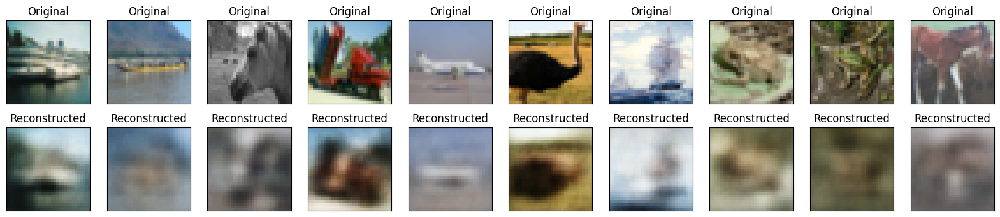

 71%|███████   | 29/41 [40:45<17:52, 89.36s/it]

Epoch 29 | Training Loss: 0.010
Epoch 29 | Validation Loss: 0.01070


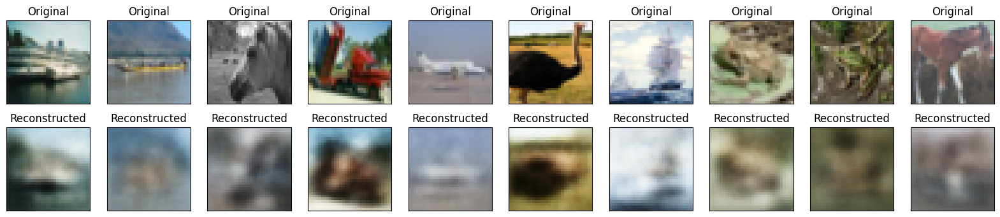

 73%|███████▎  | 30/41 [42:14<16:22, 89.32s/it]

Epoch 30 | Training Loss: 0.010
Epoch 30 | Validation Loss: 0.01009


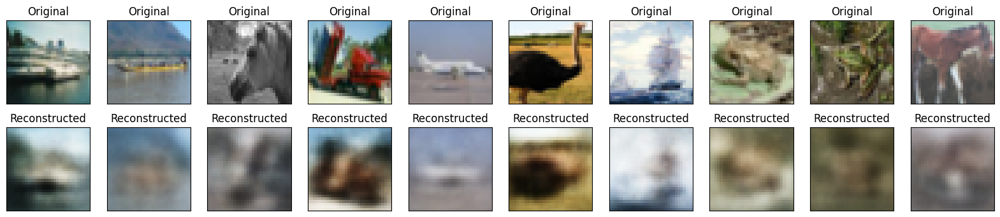

 76%|███████▌  | 31/41 [43:43<14:53, 89.33s/it]

Epoch 31 | Training Loss: 0.010
Epoch 31 | Validation Loss: 0.01008


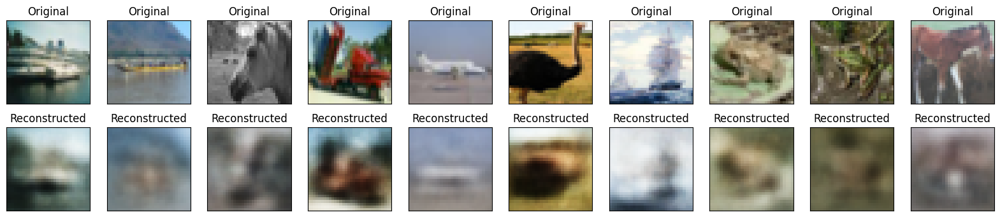

 78%|███████▊  | 32/41 [45:13<13:24, 89.39s/it]

Epoch 32 | Training Loss: 0.010
Epoch 32 | Validation Loss: 0.01016


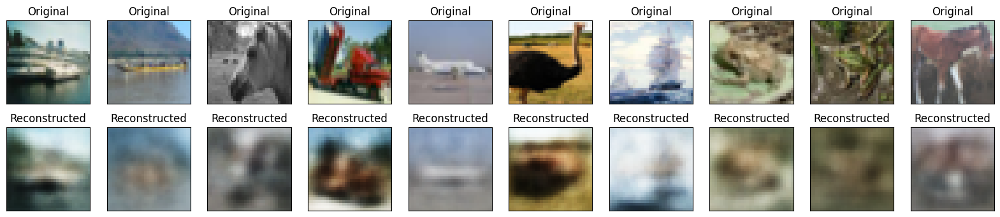

 80%|████████  | 33/41 [46:41<11:52, 89.12s/it]

Epoch 33 | Training Loss: 0.010
Epoch 33 | Validation Loss: 0.00988


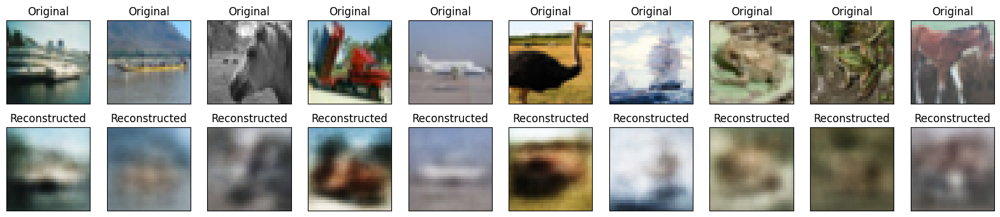

 83%|████████▎ | 34/41 [48:11<10:23, 89.14s/it]

Epoch 34 | Training Loss: 0.009
Epoch 34 | Validation Loss: 0.00999


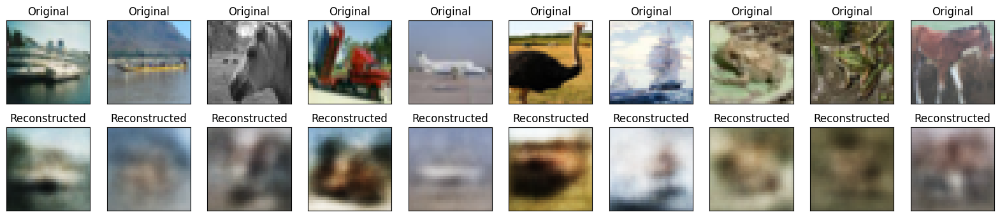

 85%|████████▌ | 35/41 [49:40<08:54, 89.12s/it]

Epoch 35 | Training Loss: 0.009
Epoch 35 | Validation Loss: 0.01018


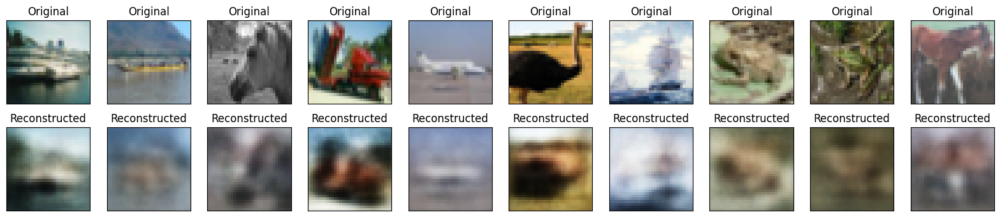

 88%|████████▊ | 36/41 [51:09<07:25, 89.14s/it]

Epoch 36 | Training Loss: 0.009
Epoch 36 | Validation Loss: 0.01003


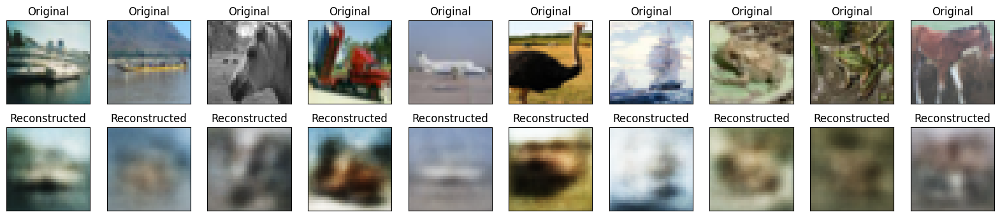

 90%|█████████ | 37/41 [52:38<05:56, 89.10s/it]

Epoch 37 | Training Loss: 0.009
Epoch 37 | Validation Loss: 0.00965


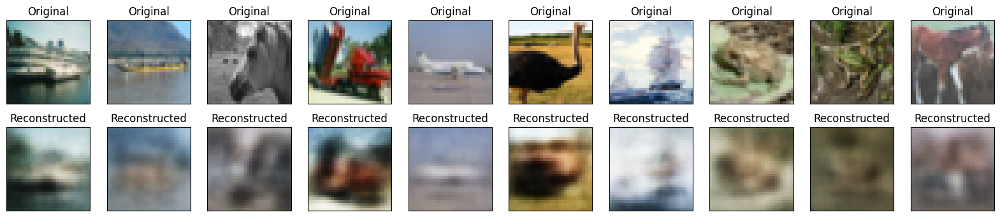

 93%|█████████▎| 38/41 [54:06<04:25, 88.66s/it]

Epoch 38 | Training Loss: 0.009
Epoch 38 | Validation Loss: 0.00966


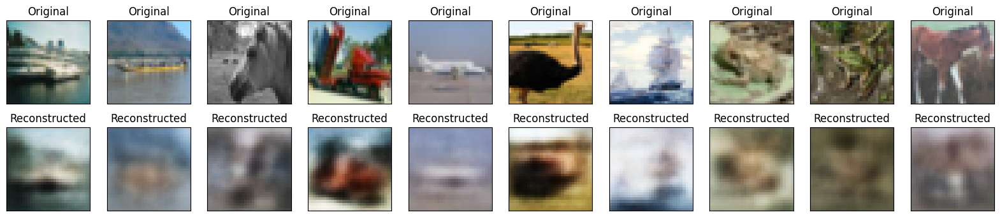

 95%|█████████▌| 39/41 [55:34<02:57, 88.64s/it]

Epoch 39 | Training Loss: 0.009
Epoch 39 | Validation Loss: 0.00957


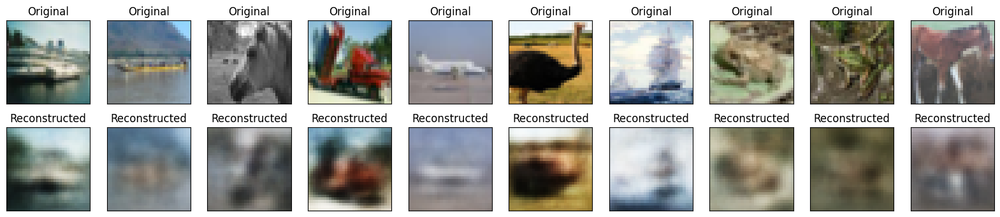

 98%|█████████▊| 40/41 [57:02<01:28, 88.54s/it]

Epoch 40 | Training Loss: 0.009
Epoch 40 | Validation Loss: 0.00968


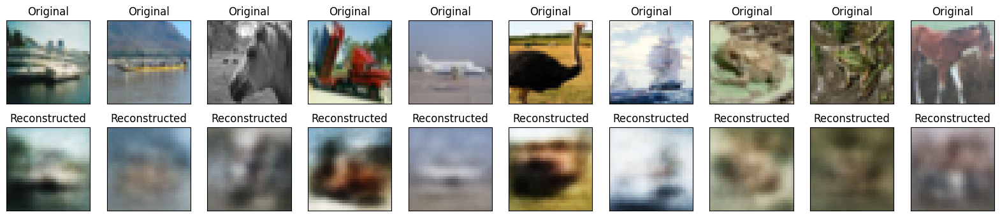

100%|██████████| 41/41 [58:31<00:00, 85.65s/it]


In [ ]:
train_loss_list = [] # keep track of the lost function on the training and validation set
val_loss_list = []

epochs = 40

for epoch in tqdm(range(epochs + 1)):  #tqdm to show progress bar with each epochs of training.
  if epoch > 0: #start training when epoch is 1 which is the second epoch
    model.train() # model is in training mode
    train_running_loss = 0.0

    for i ,(X_train, y) in enumerate(train_dl): # nested for loop though the batches of training data - X_train: images, y: labels
      X_train = X_train.to(device)
      optimizer.zero_grad()

      reconstructed_X_train = model(X_train) #forward pass through the autoencoder

      loss = criterion(reconstructed_X_train, X_train) #comapred the reconstructed images with the original and computer the mean square error loss

      loss.backward() #compute the gradients for the model parameters

      train_running_loss += loss.item() # sum the loss

      optimizer.step() #update the model parameters

    train_loss = train_running_loss / len(train_dl) #compute the training loss for the epoch
    train_loss_list.append(train_loss)
    print(f'Epoch {epoch} | Training Loss: {train_loss:.3f}') #print the training loss

  with torch.no_grad():
    model.eval()
    val_running_loss = 0.0

    for i, (X_val, y) in enumerate(valid_dl):
      X_val = X_val.to(device)

      reconstructed_X_val = model(X_val)

      loss = criterion(reconstructed_X_val, X_val)
      val_running_loss += loss.item()

    val_loss = val_running_loss / len(valid_dl)
    val_loss_list.append(val_loss)

  print(f'Epoch {epoch} | Validation Loss: {val_loss:.5f}')
  display_images(X_val, reconstructed_X_val, 10)

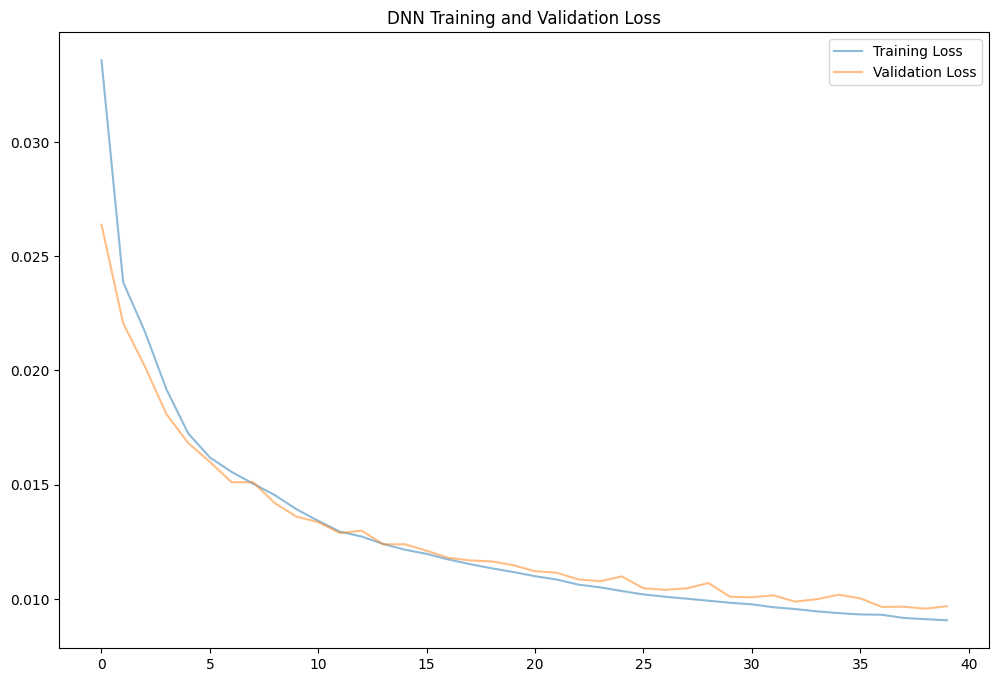

In [ ]:
fig, (ax) = plt.subplots(1,1, figsize =(12,8))

ax.plot(train_loss_list, label = "Training Loss", alpha = 0.5)
ax.plot(val_loss_list[1:], label = "Validation Loss", alpha = 0.5)
ax.set_title("DNN Training and Validation Loss")

ax.legend()

In [ ]:
test_images, _ = next(iter(test_dl))
test_images = test_images.to(device)

reconstructed_test_images = model(test_images)

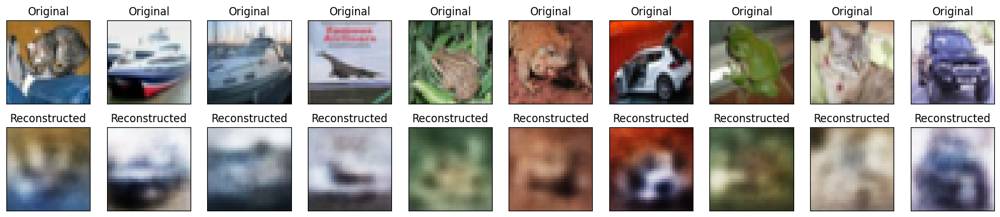

In [ ]:
display_images(test_images, reconstructed_test_images, 10)

## Reconstructing Multichannel Images with CNN Autoencoders

> The Encoder

- in_channel channel is 3 since there are colored images and correspond to RGB values of the color images.
- out_channels feature maps

> The Decoder - Since they are two layers in the encoder we need 2 layer in the decoder to match

The input to the decoder must be the output of the encoder

The transpose convolutional layer upsamples the input and produce 64 feature maps.


Sigmoid value produces values in the range [0,1] for the RGB pixel for the reconstructed image

> Symmetric convolutionsl autoencoder

- The input x is passed through the encoder

- The output of the encoder is then passed through the decoder to get the reconstructed image, which is returned.

In [13]:
class ConvAutoencoder(nn.Module):
  def __init__(self):
    super(ConvAutoencoder, self).__init__()
    #Encoder
    self.encoder = nn.Sequential(
      nn.Conv2d(in_channels = 3, out_channels = 64, kernel_size = 3, padding = 1),
      nn.ReLU(True),
      nn.MaxPool2d(kernel_size = 2, stride = 2),

      nn.Conv2d(in_channels = 64, out_channels = 16, kernel_size = 3, padding = 1),
      nn.ReLU(True),
      nn.MaxPool2d(kernel_size = 2, stride = 2) )

    #Decoder
    self.decoder = nn.Sequential(
      nn.ConvTranspose2d(in_channels = 16, out_channels = 64, kernel_size = 2, stride = 2),
      nn.ReLU(True),

      nn.ConvTranspose2d(in_channels = 64, out_channels = 3, kernel_size = 2, stride = 2),
      nn.Sigmoid()
  )
  def forward(self, x):
    x = self.encoder(x)
    x = self.decoder(x)

    return x


In [14]:
model = ConvAutoencoder().to(device)
model

ConvAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(16, 64, kernel_size=(2, 2), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(64, 3, kernel_size=(2, 2), stride=(2, 2))
    (3): Sigmoid()
  )
)

In [15]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = 1e-3)


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 0 | Validation Loss: 0.06717


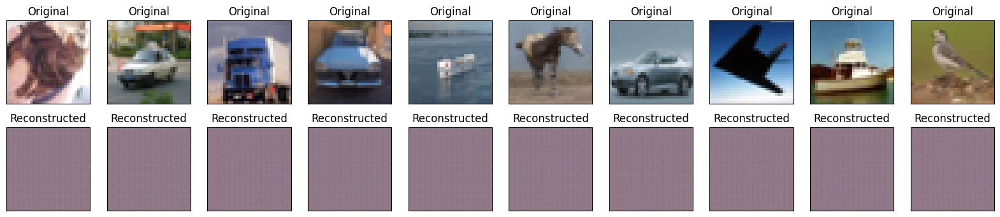

  2%|▏         | 1/41 [00:13<09:05, 13.63s/it]

Epoch 1 | Training Loss: 0.017
Epoch 1 | Validation Loss: 0.00790


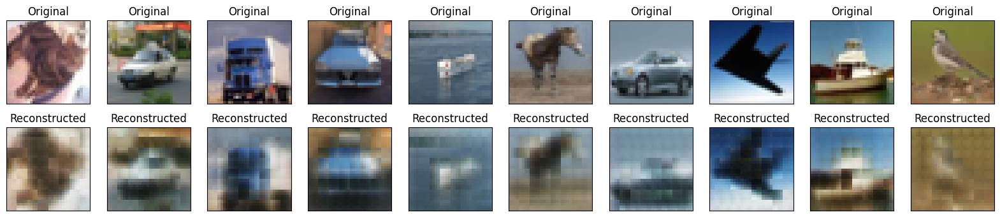

  5%|▍         | 2/41 [02:13<49:36, 76.31s/it]

Epoch 2 | Training Loss: 0.007
Epoch 2 | Validation Loss: 0.00629


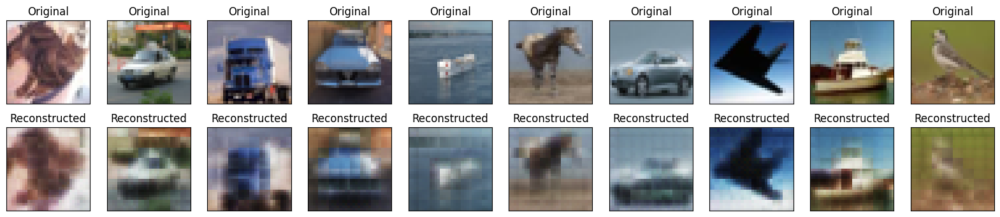

  7%|▋         | 3/41 [04:19<1:02:32, 98.74s/it]

Epoch 3 | Training Loss: 0.006
Epoch 3 | Validation Loss: 0.00569


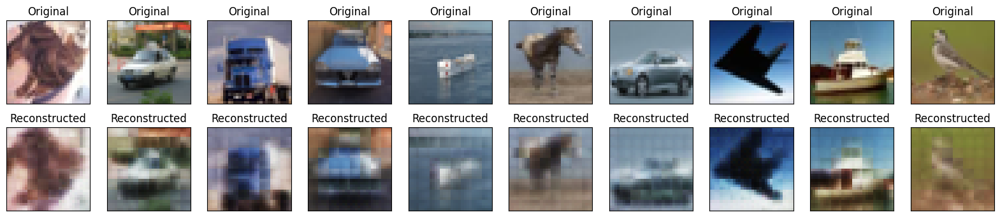

 10%|▉         | 4/41 [06:23<1:07:08, 108.87s/it]

Epoch 4 | Training Loss: 0.005
Epoch 4 | Validation Loss: 0.00519


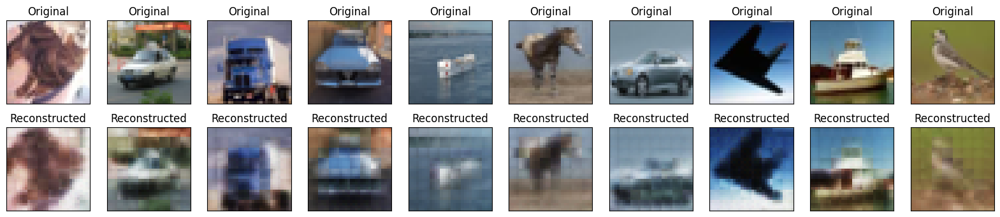

 12%|█▏        | 5/41 [08:29<1:09:00, 115.03s/it]

Epoch 5 | Training Loss: 0.005
Epoch 5 | Validation Loss: 0.00484


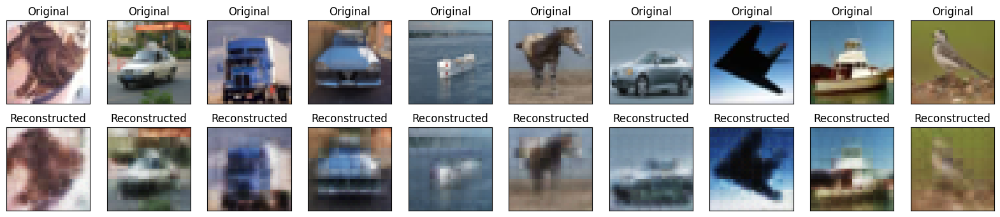

 15%|█▍        | 6/41 [10:41<1:10:32, 120.92s/it]

Epoch 6 | Training Loss: 0.005
Epoch 6 | Validation Loss: 0.00467


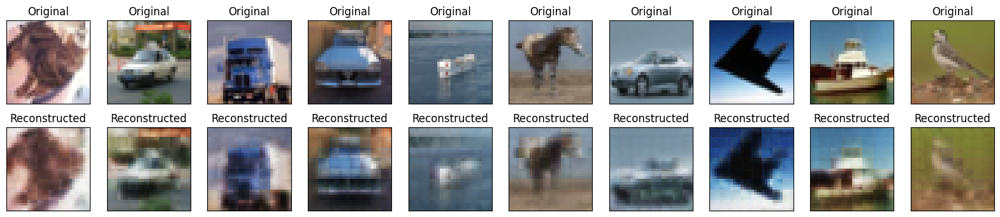

 17%|█▋        | 7/41 [12:54<1:10:36, 124.59s/it]

Epoch 7 | Training Loss: 0.005
Epoch 7 | Validation Loss: 0.00447


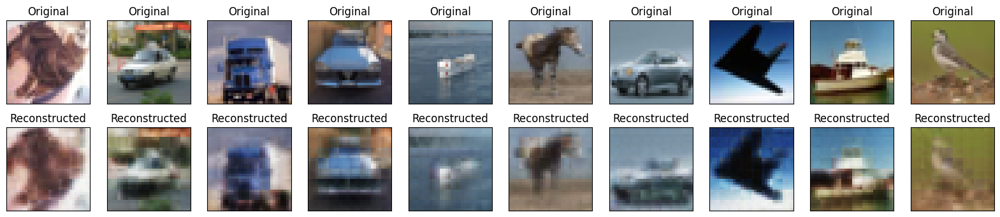

 20%|█▉        | 8/41 [15:06<1:09:57, 127.20s/it]

Epoch 8 | Training Loss: 0.004
Epoch 8 | Validation Loss: 0.00440


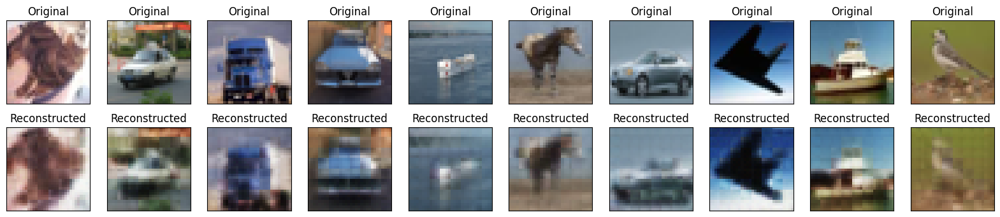

 22%|██▏       | 9/41 [17:13<1:07:49, 127.17s/it]

Epoch 9 | Training Loss: 0.004
Epoch 9 | Validation Loss: 0.00426


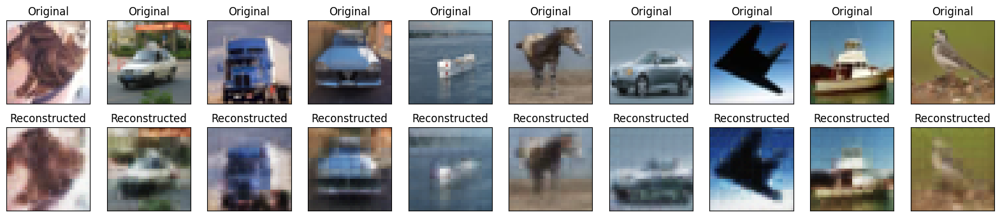

 24%|██▍       | 10/41 [19:19<1:05:22, 126.54s/it]

Epoch 10 | Training Loss: 0.004
Epoch 10 | Validation Loss: 0.00417


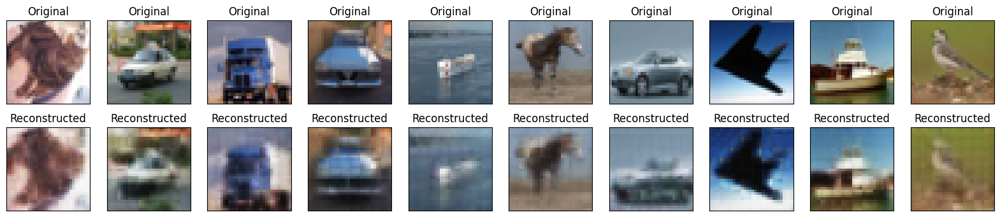

 27%|██▋       | 11/41 [21:24<1:03:09, 126.31s/it]

Epoch 11 | Training Loss: 0.004
Epoch 11 | Validation Loss: 0.00410


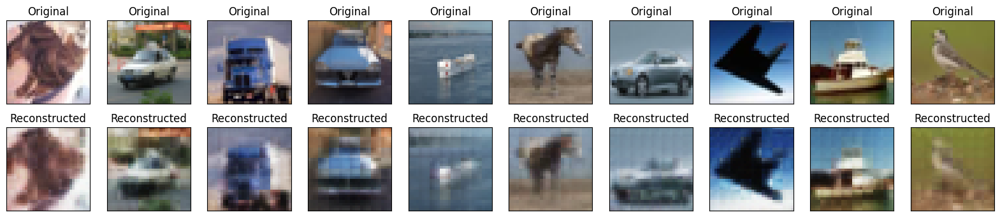

 29%|██▉       | 12/41 [23:46<1:03:15, 130.87s/it]

Epoch 12 | Training Loss: 0.004
Epoch 12 | Validation Loss: 0.00402


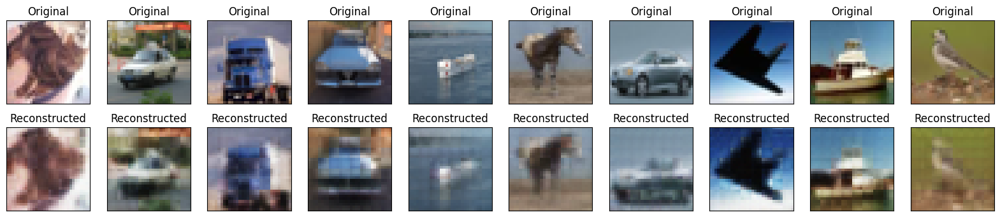

 32%|███▏      | 13/41 [26:35<1:06:32, 142.60s/it]

Epoch 13 | Training Loss: 0.004
Epoch 13 | Validation Loss: 0.00398


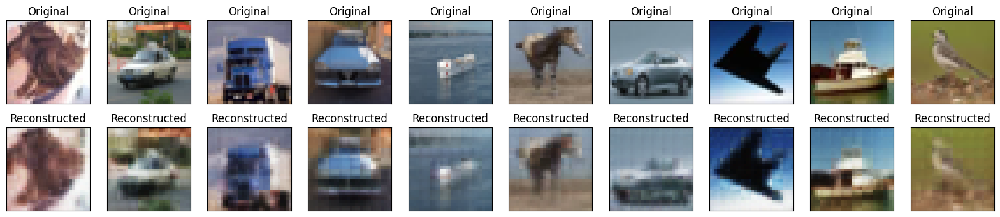

 34%|███▍      | 14/41 [29:03<1:04:55, 144.28s/it]

Epoch 14 | Training Loss: 0.004
Epoch 14 | Validation Loss: 0.00391


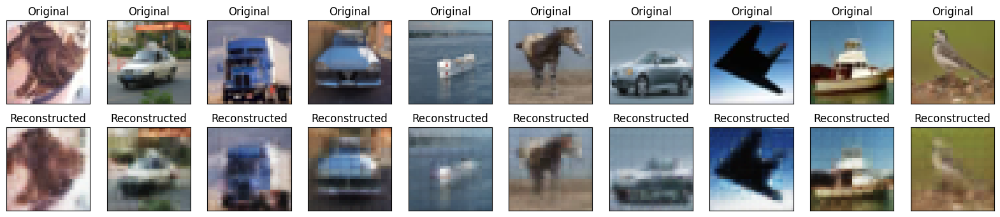

 37%|███▋      | 15/41 [31:11<1:00:19, 139.23s/it]

Epoch 15 | Training Loss: 0.004
Epoch 15 | Validation Loss: 0.00389


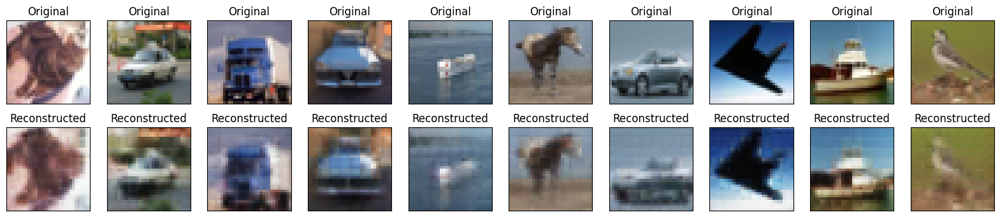

 39%|███▉      | 16/41 [33:16<56:16, 135.06s/it]  

Epoch 16 | Training Loss: 0.004
Epoch 16 | Validation Loss: 0.00378


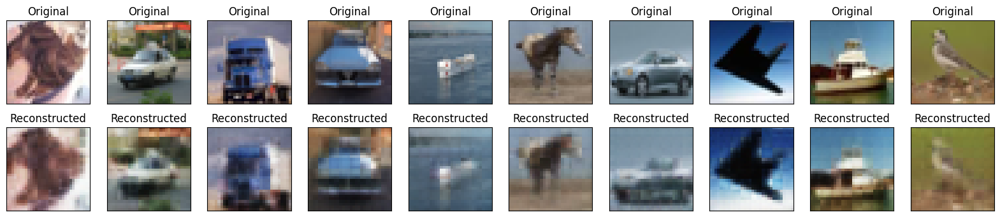

 41%|████▏     | 17/41 [35:23<52:59, 132.48s/it]

Epoch 17 | Training Loss: 0.004
Epoch 17 | Validation Loss: 0.00379


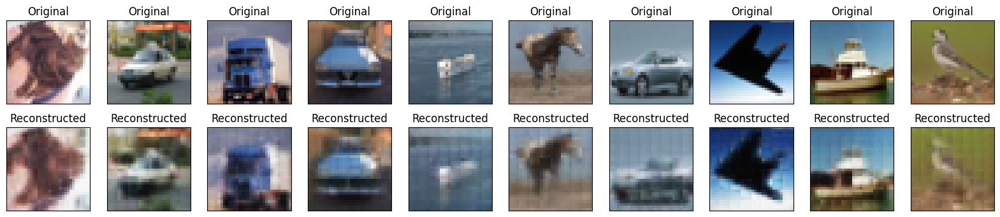

 44%|████▍     | 18/41 [37:29<50:05, 130.69s/it]

Epoch 18 | Training Loss: 0.004
Epoch 18 | Validation Loss: 0.00370


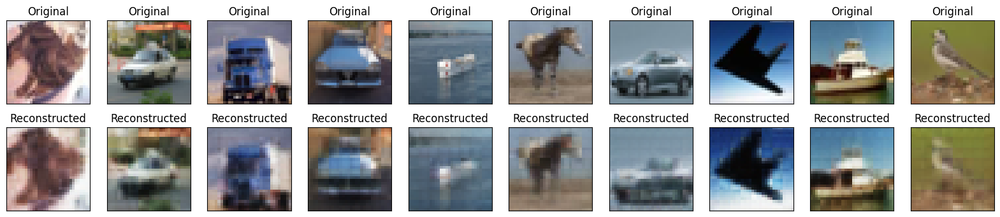

 46%|████▋     | 19/41 [39:35<47:24, 129.29s/it]

Epoch 19 | Training Loss: 0.004
Epoch 19 | Validation Loss: 0.00368


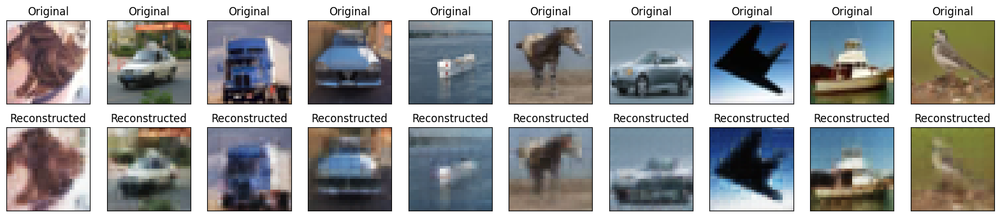

 49%|████▉     | 20/41 [41:42<44:57, 128.45s/it]

Epoch 20 | Training Loss: 0.004
Epoch 20 | Validation Loss: 0.00364


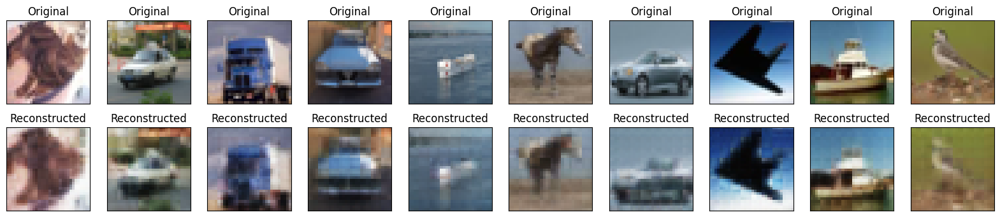

 51%|█████     | 21/41 [43:49<42:42, 128.13s/it]

Epoch 21 | Training Loss: 0.004
Epoch 21 | Validation Loss: 0.00362


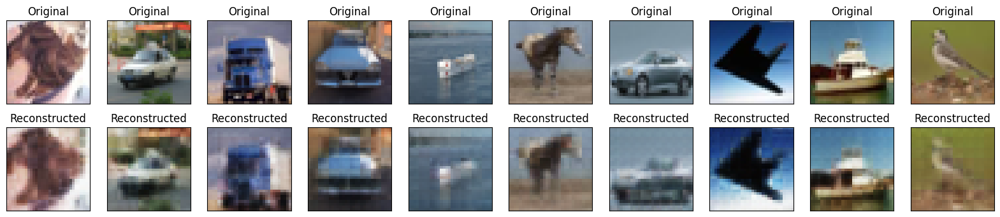

 54%|█████▎    | 22/41 [45:55<40:22, 127.49s/it]

Epoch 22 | Training Loss: 0.004
Epoch 22 | Validation Loss: 0.00358


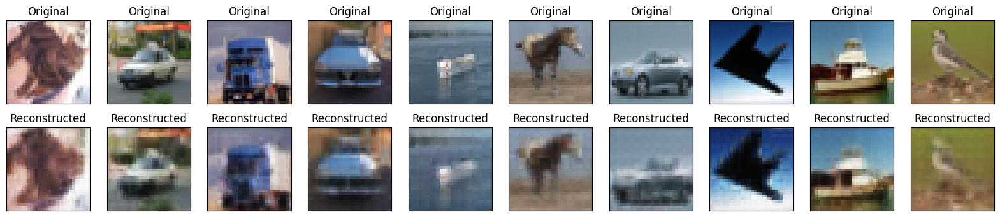

 56%|█████▌    | 23/41 [48:02<38:08, 127.11s/it]

Epoch 23 | Training Loss: 0.004
Epoch 23 | Validation Loss: 0.00355


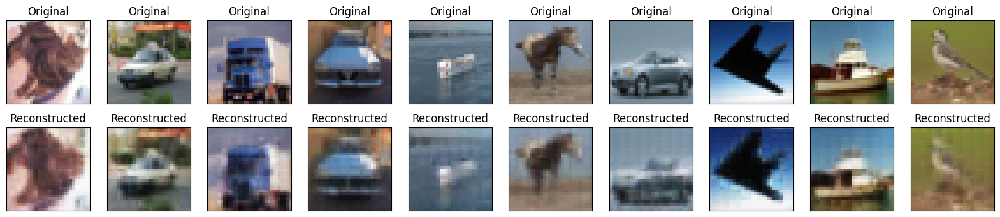

 59%|█████▊    | 24/41 [50:08<35:55, 126.80s/it]

Epoch 24 | Training Loss: 0.004
Epoch 24 | Validation Loss: 0.00356


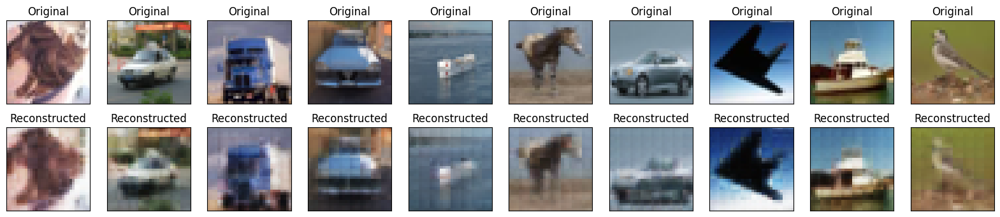

 61%|██████    | 25/41 [52:13<33:43, 126.50s/it]

Epoch 25 | Training Loss: 0.004
Epoch 25 | Validation Loss: 0.00356


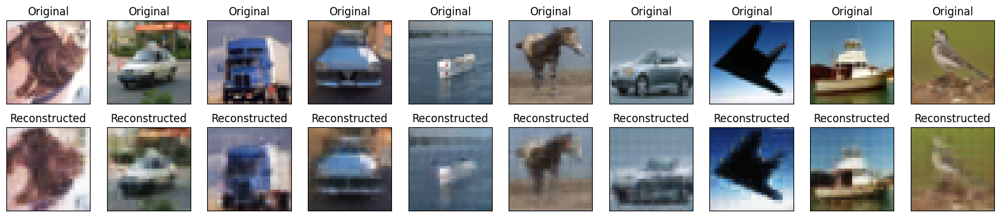

 63%|██████▎   | 26/41 [54:20<31:38, 126.54s/it]

Epoch 26 | Training Loss: 0.004
Epoch 26 | Validation Loss: 0.00349


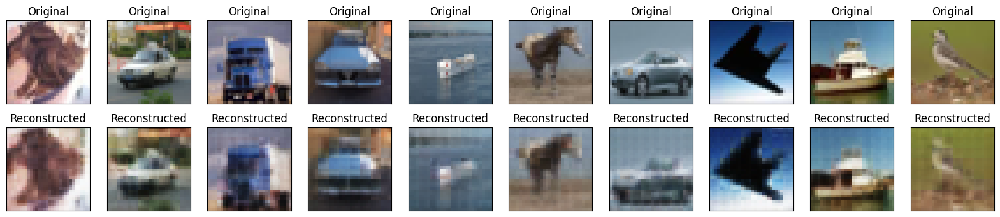

 66%|██████▌   | 27/41 [56:27<29:31, 126.57s/it]

Epoch 27 | Training Loss: 0.003
Epoch 27 | Validation Loss: 0.00349


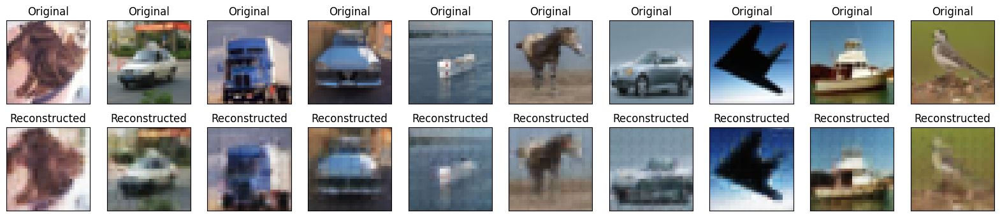

 68%|██████▊   | 28/41 [58:34<27:27, 126.71s/it]

Epoch 28 | Training Loss: 0.003
Epoch 28 | Validation Loss: 0.00342


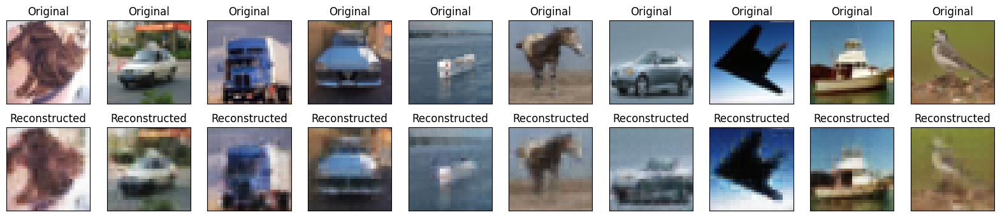

 71%|███████   | 29/41 [1:00:41<25:22, 126.85s/it]

Epoch 29 | Training Loss: 0.003
Epoch 29 | Validation Loss: 0.00347


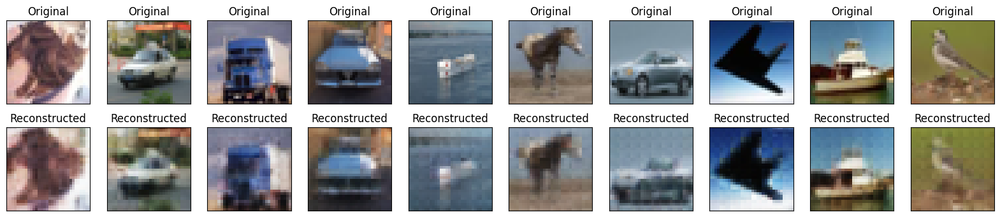

 73%|███████▎  | 30/41 [1:02:47<23:13, 126.67s/it]

Epoch 30 | Training Loss: 0.003
Epoch 30 | Validation Loss: 0.00345


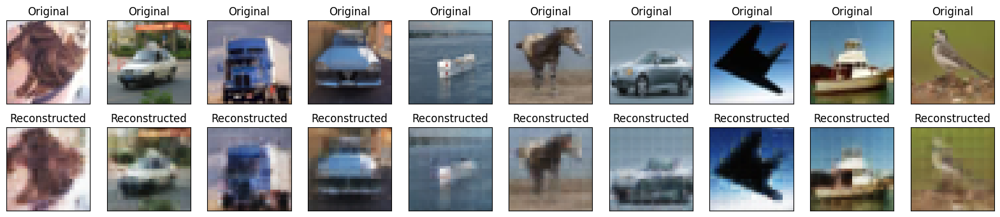

 76%|███████▌  | 31/41 [1:04:54<21:06, 126.62s/it]

Epoch 31 | Training Loss: 0.003
Epoch 31 | Validation Loss: 0.00340


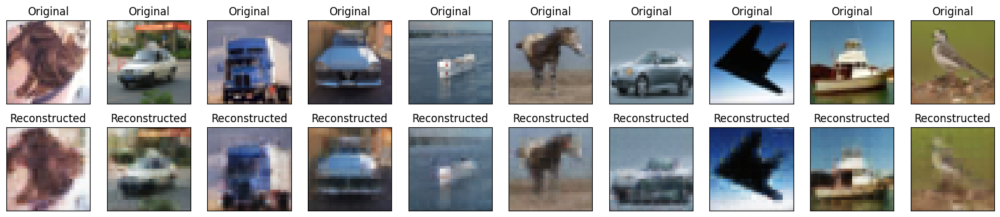

 78%|███████▊  | 32/41 [1:07:00<18:59, 126.62s/it]

Epoch 32 | Training Loss: 0.003
Epoch 32 | Validation Loss: 0.00335


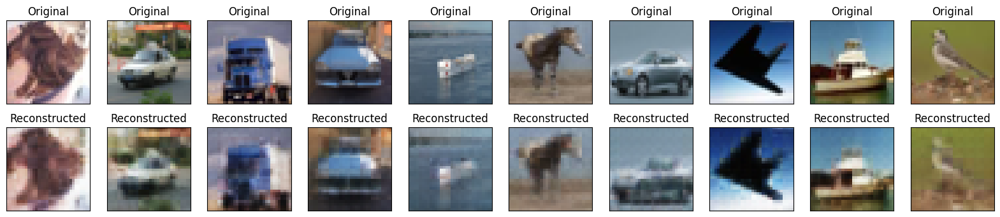

 80%|████████  | 33/41 [1:09:06<16:50, 126.34s/it]

Epoch 33 | Training Loss: 0.003
Epoch 33 | Validation Loss: 0.00334


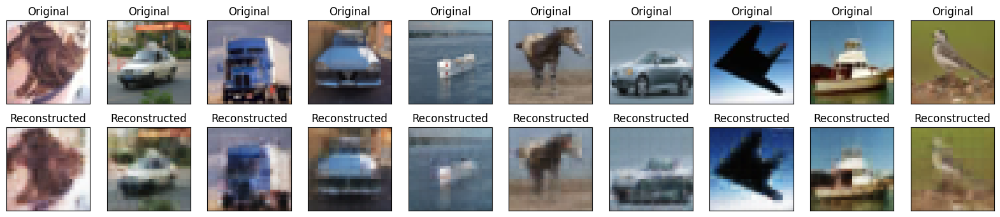

 83%|████████▎ | 34/41 [1:11:13<14:45, 126.46s/it]

Epoch 34 | Training Loss: 0.003
Epoch 34 | Validation Loss: 0.00337


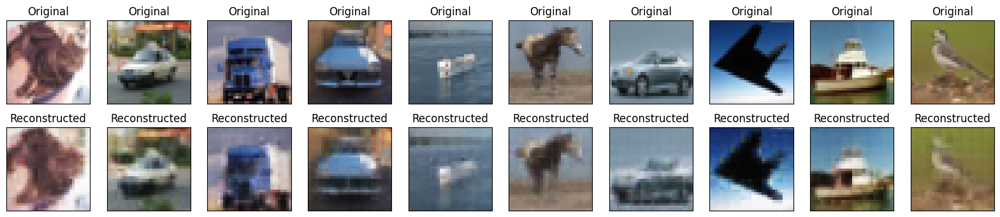

 85%|████████▌ | 35/41 [1:13:19<12:38, 126.49s/it]

Epoch 35 | Training Loss: 0.003
Epoch 35 | Validation Loss: 0.00331


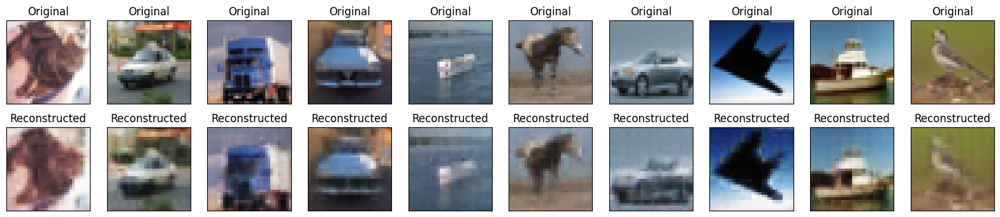

 88%|████████▊ | 36/41 [1:15:25<10:31, 126.38s/it]

Epoch 36 | Training Loss: 0.003
Epoch 36 | Validation Loss: 0.00331


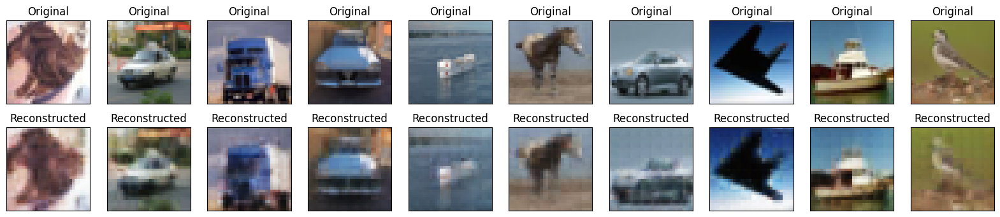

 90%|█████████ | 37/41 [1:17:32<08:25, 126.32s/it]

Epoch 37 | Training Loss: 0.003
Epoch 37 | Validation Loss: 0.00331


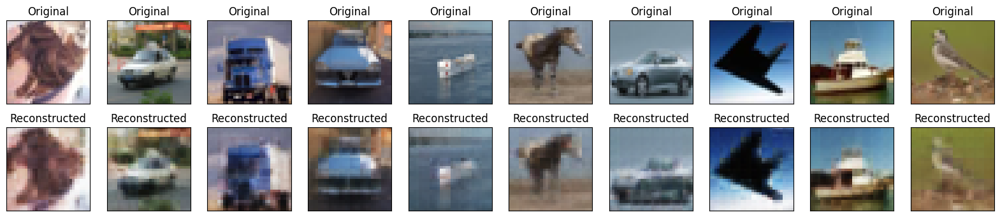

 93%|█████████▎| 38/41 [1:19:37<06:18, 126.17s/it]

Epoch 38 | Training Loss: 0.003
Epoch 38 | Validation Loss: 0.00329


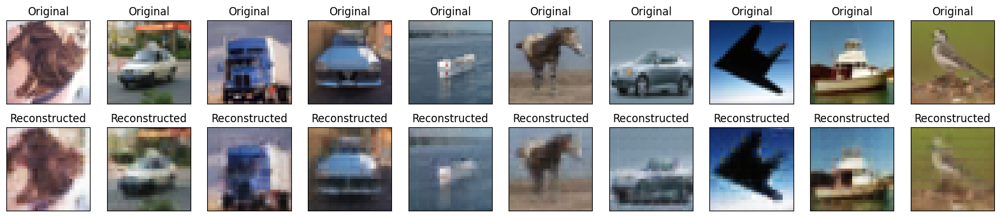

 95%|█████████▌| 39/41 [1:21:44<04:12, 126.21s/it]

Epoch 39 | Training Loss: 0.003
Epoch 39 | Validation Loss: 0.00330


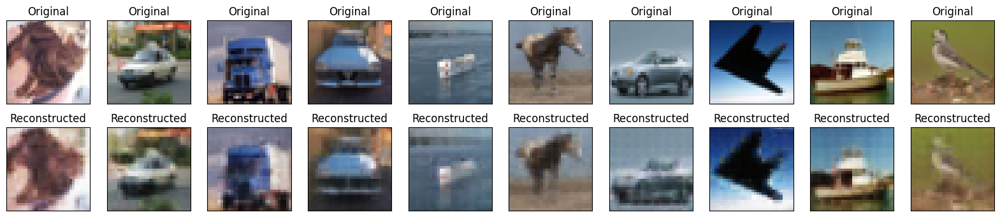

 98%|█████████▊| 40/41 [1:23:50<02:06, 126.13s/it]

Epoch 40 | Training Loss: 0.003
Epoch 40 | Validation Loss: 0.00328


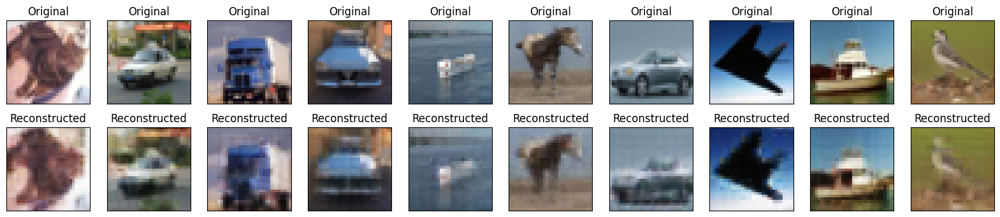

100%|██████████| 41/41 [1:25:57<00:00, 125.79s/it]


In [16]:
#Training Process

train_loss_list = [] # keep track of the lost function on the training and validation set
val_loss_list = []
epochs = 40 # more complex images need more epochs of training

for epoch in tqdm(range(epochs + 1)):  #tqdm to show progress bar with each epochs of training.
  if epoch > 0: #start training when epoch is 1 which is the second epoch
    model.train() # model is in training mode
    train_running_loss = 0.0

    # Iterate over every batch in the training data
    for i ,(X_train, y) in enumerate(train_dl): # nested for loop though the batches of training data - X_train: images, y: labels
      X_train = X_train.to(device)
      optimizer.zero_grad()

      reconstructed_X_train = model(X_train) #forward pass through the autoencoder

      loss = criterion(reconstructed_X_train, X_train) #comapred the reconstructed images with the original and computer the mean square error loss

      loss.backward() #compute the gradients for the model parameters

      train_running_loss += loss.item() # sum the loss

      optimizer.step() #update the model parameters

    train_loss = train_running_loss / len(train_dl) #compute the training loss for the epoch
    train_loss_list.append(train_loss)
    print(f'Epoch {epoch} | Training Loss: {train_loss:.3f}') #print the training loss

  # after every epoch of training , turn off gradient, switch the model to evaluation mode
  with torch.no_grad():
    model.eval()
    val_running_loss = 0.0

    # we pass the data through the model and compute the validation loss
    for i, (X_val, y) in enumerate(valid_dl):
      X_val = X_val.to(device)

      reconstructed_X_val = model(X_val)

      loss = criterion(reconstructed_X_val, X_val)
      val_running_loss += loss.item()

    val_loss = val_running_loss / len(valid_dl)
    val_loss_list.append(val_loss)

  print(f'Epoch {epoch} | Validation Loss: {val_loss:.5f}')
  display_images(X_val, reconstructed_X_val, 10)

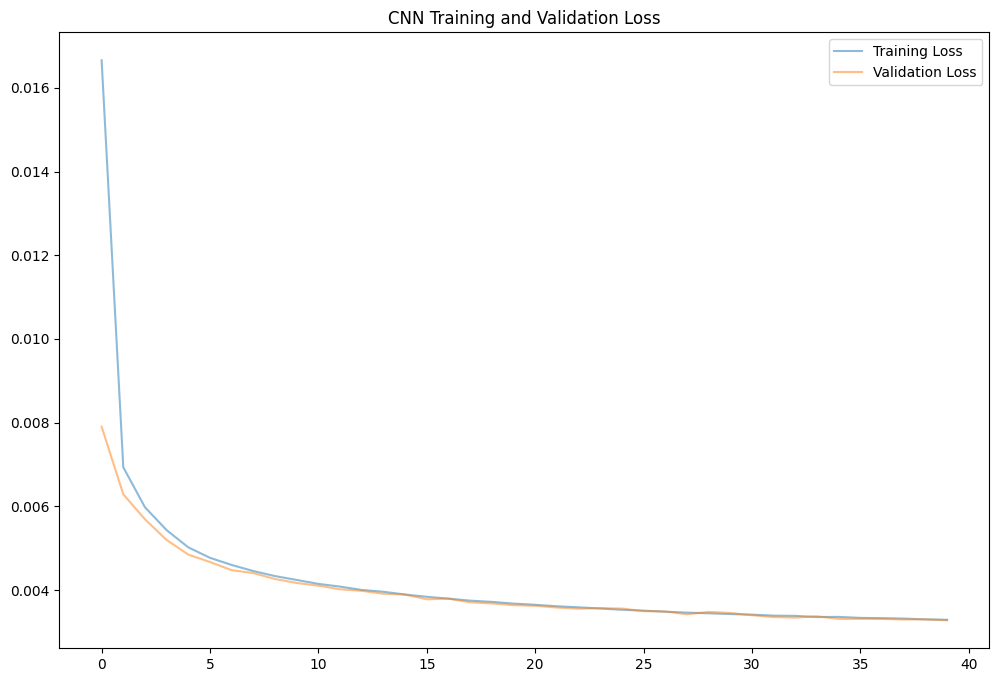

In [17]:
fig, (ax) = plt.subplots(1,1, figsize =(12,8))

ax.plot(train_loss_list, label = "Training Loss", alpha = 0.5)
ax.plot(val_loss_list[1:], label = "Validation Loss", alpha = 0.5)
ax.set_title("CNN Training and Validation Loss")
ax.legend()

Losses continue to fall after 35 epochs, if you training for more epochs the reconstructed images would continue to be better

Visualize the Latent Representations generated by the encoder in 2D space.
- Get the feature map encodings of the input images
- Flatten them and then reduce their dimensionality

In [18]:
test_images, _ = next(iter(test_dl)) # one batch of images from the training data and pass those images through encoder
test_images = test_images.to(device)

reconstructed_test_images = model(test_images)

Reconstructed image for one batch of data, Every image has a 3D structure

1. 128 images in a batch
2. 16 feature maps - latent representation of each input image
3. 8 x 8 each feature map is 8 x 8 pixels

In [19]:
reconstructed_test_images.shape

torch.Size([128, 3, 32, 32])

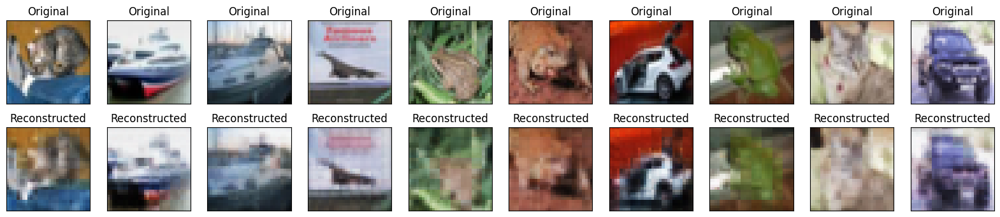

In [21]:
display_images(test_images, reconstructed_test_images, 10)

In [22]:
def get_encoding(model, data_loader):
  encodings_list = []
  labels_list = []

  for images, labels in data_loader:  #loop over all batches of the data loader
    with torch.no_grad():
      encoding = model.encoder(images.to(device)) # pass the images through the encoder of the model to get encodings

      #Flatten the encodings so that we have the same batch (batch_size is the first dimension at 0)
      # 16 - 8 x 8 feature maps will be flattened to be a single vector
      encodings = encoding.view(encoding.size(0), -1).cpu().numpy()

      encodings_list.append(encodings)
      labels_list.extend(labels.tolist())

  # Flattened encodings for every input image and corresponding labels
  # return one large tensor with the encodings for all images in the data loader
  return np.vstack(encodings_list), labels_list #np.vstack so we dont have batches of encodings


In [23]:
encodings, labels = get_encoding(model, train_dl)

In [24]:
len(encodings)

40000

In [25]:
len(labels)

40000

Dimensionality reduction on the flattened representations.

There are 8 x 8 feature maps and there are 16 of them so there are 16 x 8 x8 = 1024 number of pixels

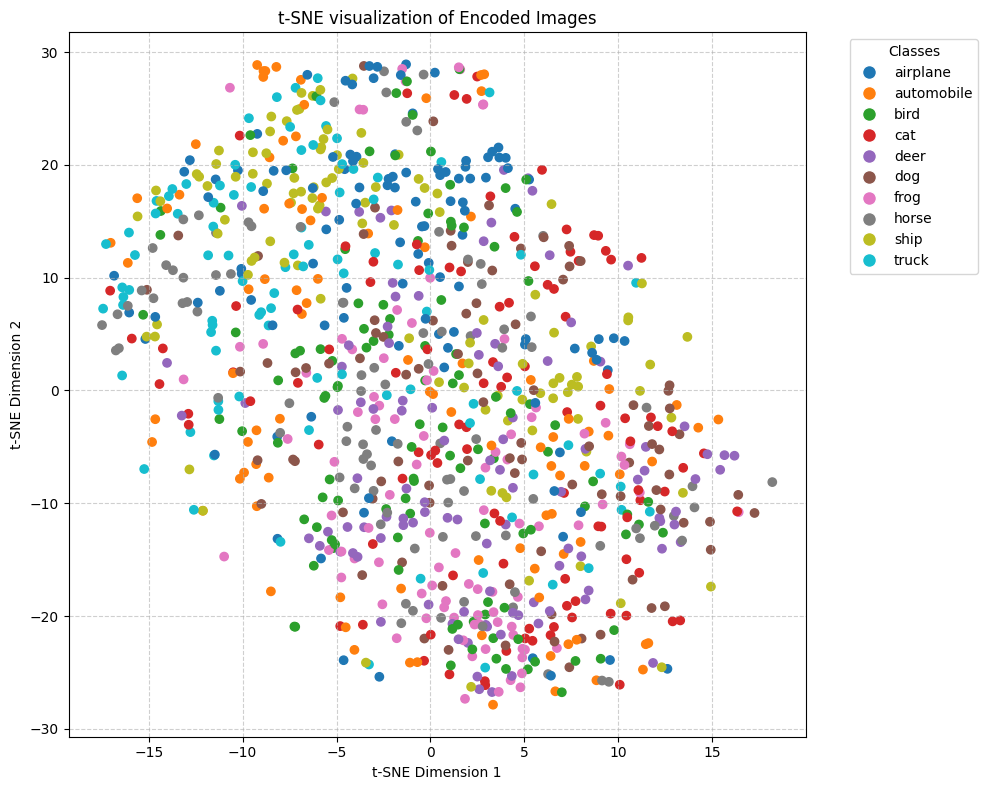

In [26]:
# Performn T-SNE : t-stochastic neighbour embedding
from sklearn.manifold import TSNE

tsne = TSNE(n_components = 2, random_state = 42)          # instantiate the TSNE estimator ; n_components=2 means reduced to 2D
feature_maps_tsne = tsne.fit_transform(encodings[:1000])  # pass in the feature maps with reduced dimensionality

# Visualize T-SNE
plt.figure(figsize=(10, 8))
scatter = plt.scatter(feature_maps_tsne[:, 0], feature_maps_tsne[:, 1], c = labels[:1000], cmap = 'tab10')

# Get class names from the dataset
# Assuming train_data.dataset.classes is available from earlier cells
class_names = train_data.dataset.classes

# Create a legend
legend_elements = []
for i, class_name in enumerate(class_names):
    # Create a dummy scatter point for each class to use in the legend
    legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', label=class_name,
                             markerfacecolor=scatter.cmap(scatter.norm(i)), markersize=10))

plt.legend(handles=legend_elements, title='Classes', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('t-SNE visualization of Encoded Images')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()